# Configuración previa

## Importación de librerías

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_breast_cancer
import os
from collections import Counter
import random
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE

## Replicabilidad

In [35]:
seed = 0
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
random.seed(seed)

# Carga y análisis

## Carga

In [36]:
dataset_cancer = load_breast_cancer()

data = pd.DataFrame(dataset_cancer.data, columns=dataset_cancer.feature_names)
target = pd.Series(dataset_cancer.target, name='diagnosis').map({0: 'malignant', 1:'benign'})

## Análisis

### Features

In [31]:
print('Valores corruptos en el dataset:', sum(data.isnull().sum()))
print("Columnas que no son numéricas:", list(data.select_dtypes(exclude=['number']).columns))

Valores corruptos en el dataset: 0
Columnas que no son numéricas: []


#### Análisis de distribuciones

In [12]:
data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [18]:
print('Numero de características:', data.shape[1])

print('Numero de registros:', data.shape[0])

Numero de características: 30
Numero de registros: 569


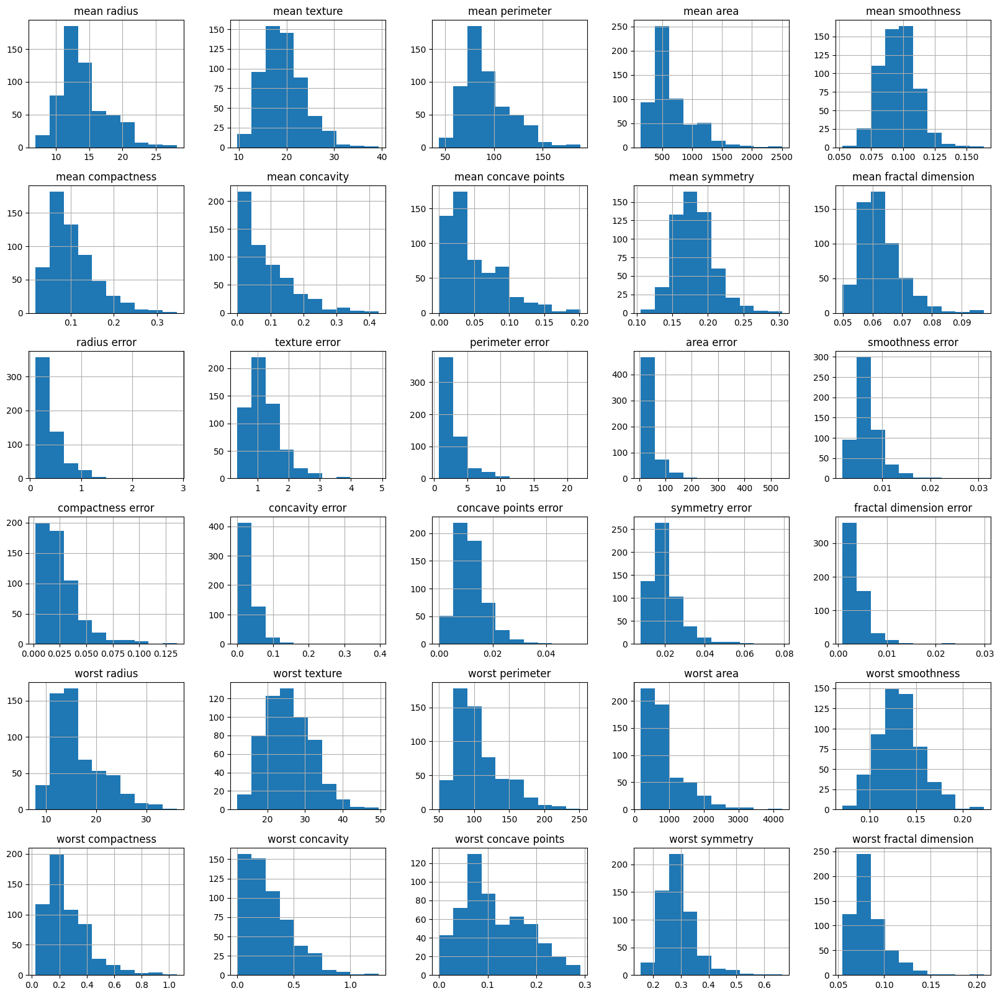

In [ ]:
data.hist(figsize=(20, 20))
plt.show()

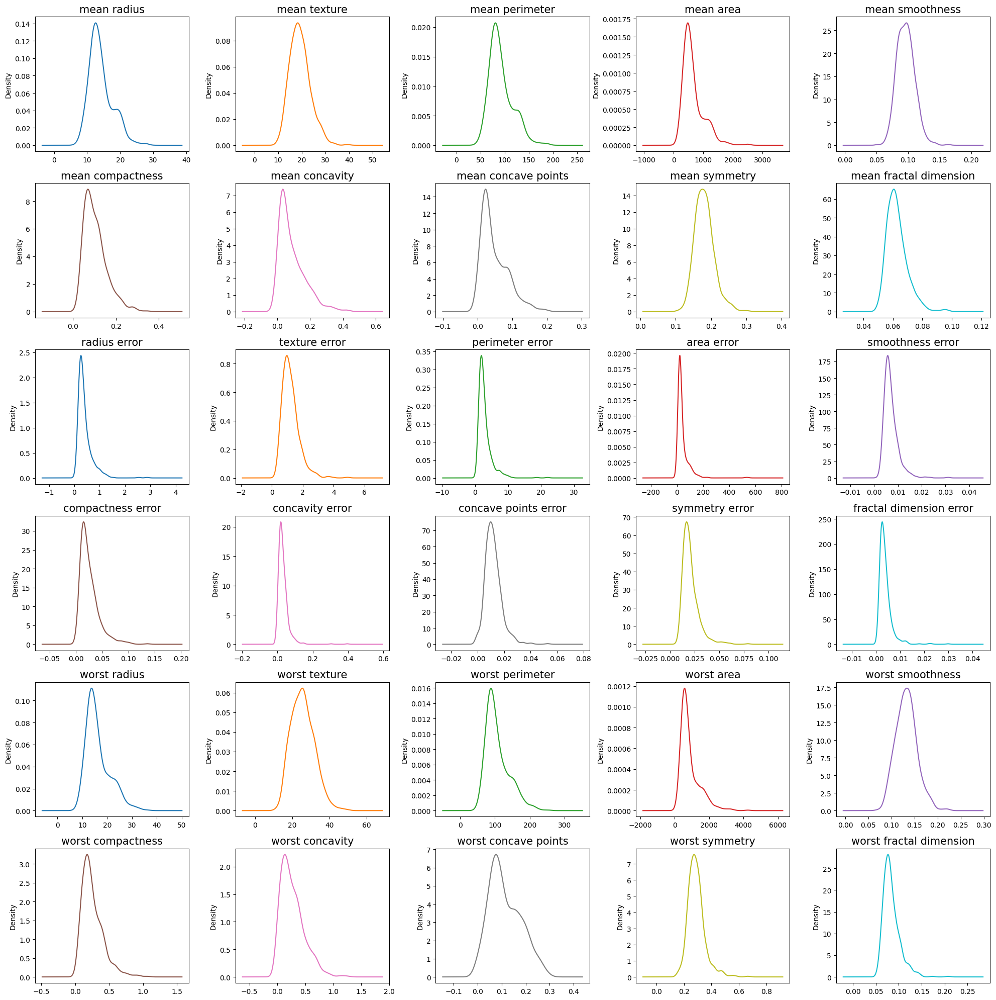

In [42]:
axes = data.plot(figsize=(20, 20), kind='density', subplots=True, layout=(6,5), sharex=False, legend=False)
for ax, col in zip(axes.flatten(), data.columns):
    ax.set_title(col, fontsize=15)
plt.tight_layout()
plt.show()

In [ ]:
# Distribución normalizada
scaler = MinMaxScaler()
data_norm = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

ordered_cols = data_norm.std().sort_values().index
data_norm[ordered_cols].plot.density(figsize=(6, 30), subplots=True, yticks=[])
plt.xlim([-0.5, 1.5])
plt.tight_layout()
plt.show()

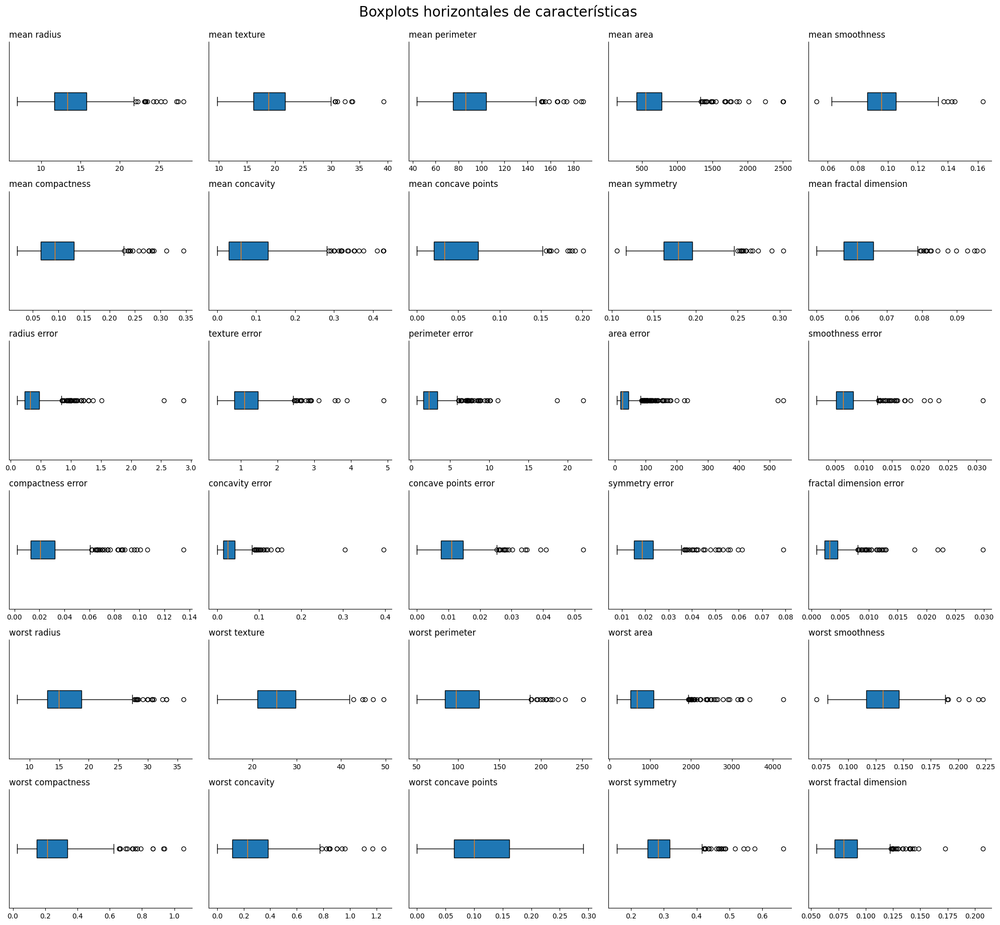

In [25]:
fig, axes = plt.subplots(6, 5, figsize=(20, 18))
axes = axes.flatten()

# Recorrer columnas y graficar
for i, col in enumerate(data.columns[:30]):
    ax = axes[i]
    ax.boxplot(data[col].dropna(), vert=False, patch_artist=True,
               boxprops=dict(facecolor='#1f77b4'))

    # Título
    ax.set_title(col, fontsize=12, loc='left')

    # Ocultar eje Y
    ax.get_yaxis().set_visible(False)

    # Ocultar bordes superior y derecho
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Opcional: reducir un poco el espacio del eje X
    ax.tick_params(axis='x', labelsize=10)

# Eliminar ejes vacíos si hay menos de 30 columnas
for j in range(len(data.columns), len(axes)):
    fig.delaxes(axes[j])

# Ajustar diseño
plt.tight_layout()
plt.suptitle('Boxplots horizontales de características', fontsize=20, y=1.02)
plt.show()

#### Distribuciones conjuntas

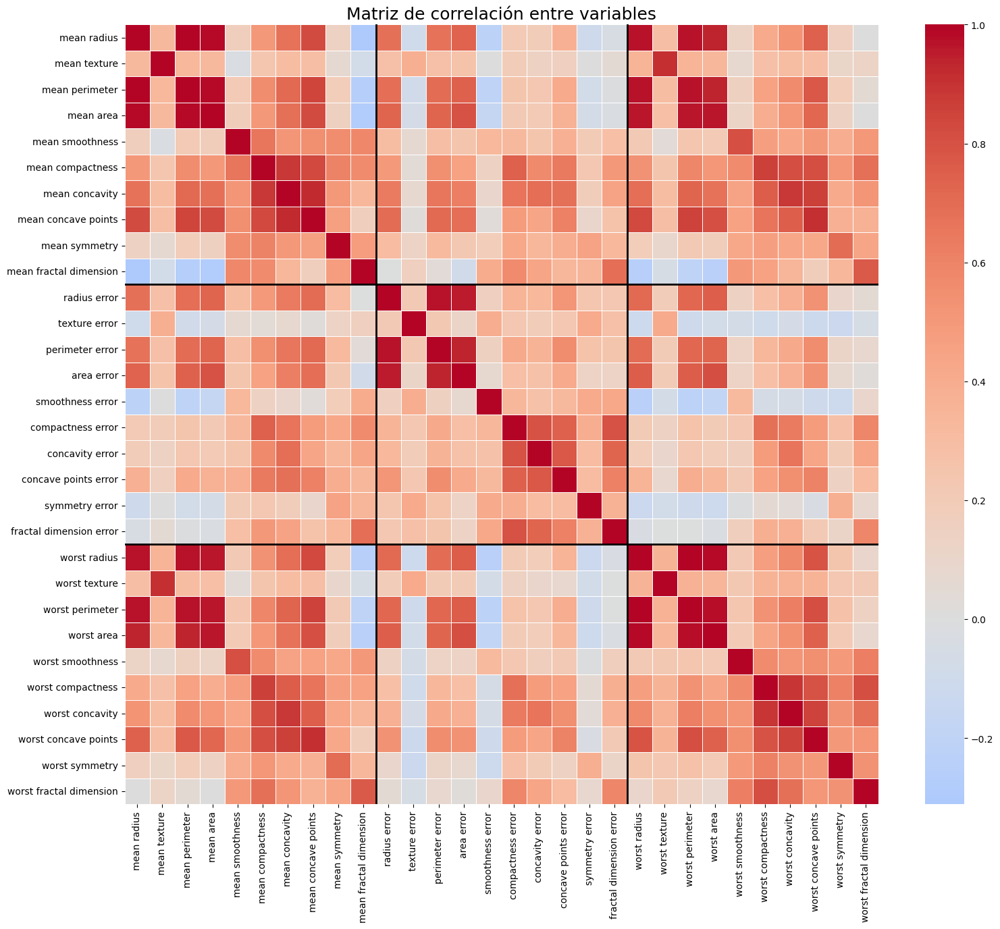

In [4]:
plt.figure(figsize=(18, 15))
corr = data.corr()
ax = sns.heatmap(corr, annot=False, cmap='coolwarm', center=0, linewidths=0.5) # 'viridis'

# Líneas divisorias cada 10 características
for i in [10, 20]:
    ax.axhline(i, color='black', linewidth=2)
    ax.axvline(i, color='black', linewidth=2)

plt.title('Matriz de correlación entre variables', fontsize=18)
plt.show()

### Targets

In [ ]:
Counter(target)

Counter({'benign': 357, 'malignant': 212})

In [8]:
# fijamos los colores para que haya consistencia
colors = {'benign': '#1f77b4', 'malignant': '#ff7f0e'}

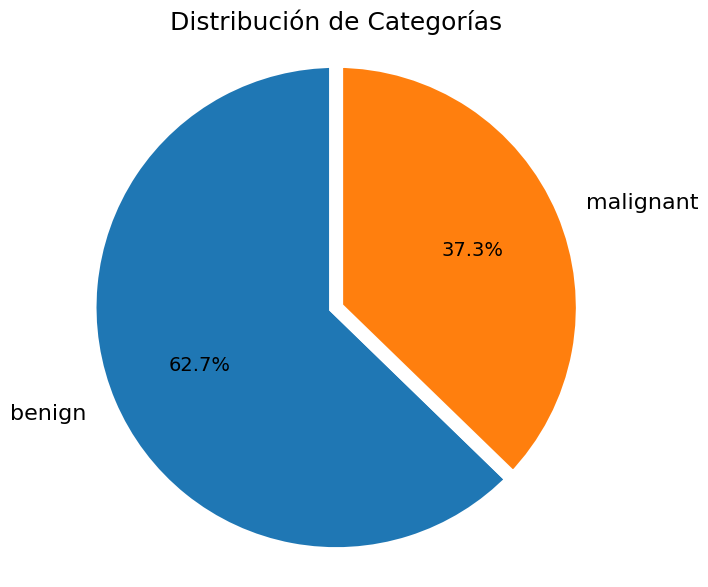

In [19]:
counts = target.value_counts()

plt.figure(figsize=(7, 7))
wedges, texts, autotexts = plt.pie(counts, labels=counts.index, colors=[colors[label] for label in counts.index], autopct='%1.1f%%', startangle=90, wedgeprops={'edgecolor': 'white', 'linewidth': 10}, textprops={'fontsize': 14})

for text in texts:
    text.set_fontsize(16)

plt.title('Distribución de Categorías', fontsize=18)
plt.axis('equal')
plt.show()

In [6]:
# fijamos los colores para que haya consistencia
colors = {'benign': '#1f77b4', 'malignant': '#ff7f0e'}

### Data y target

#### PairPlot por secciones

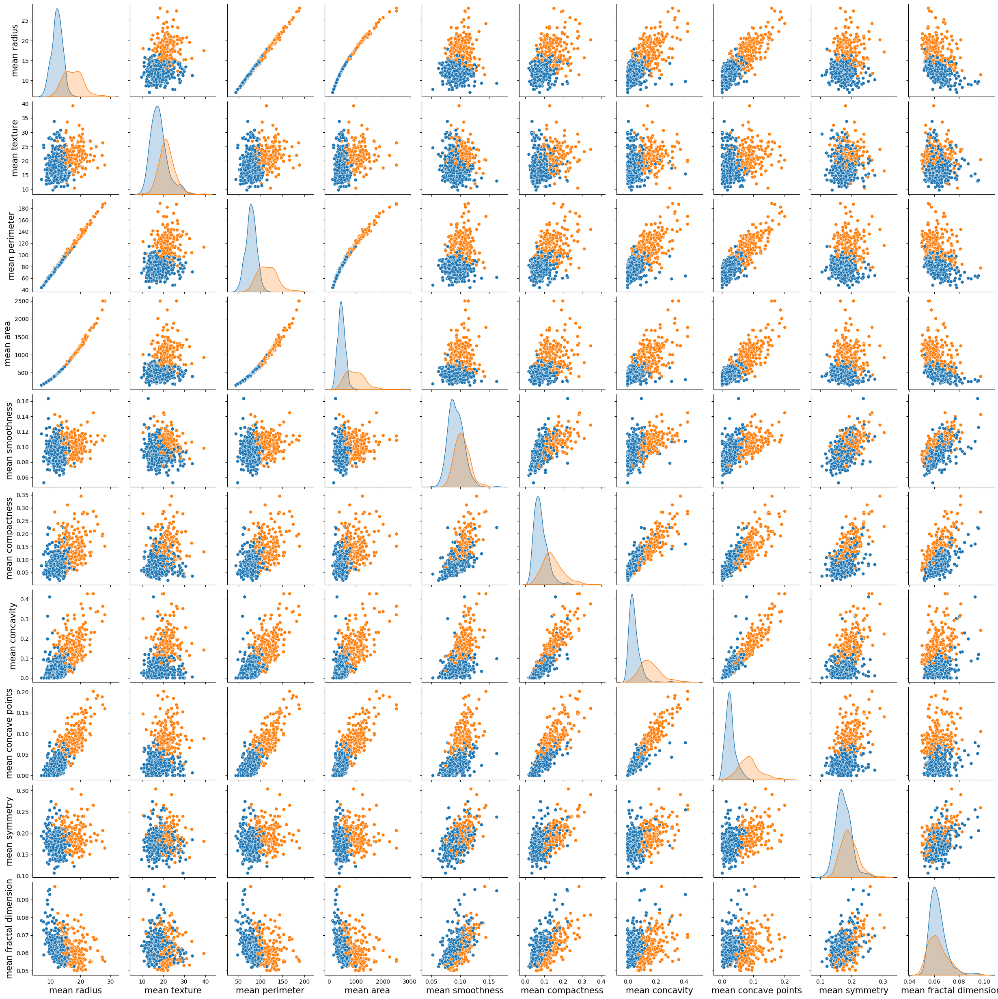

In [38]:
# Mean
df = data[['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension']].copy()
df['target'] = target


pairplot = sns.pairplot(df, hue='target', diag_kind="kde", palette=colors)
pairplot._legend.remove()

for ax in pairplot.axes.flatten():
       ax.set_xlabel(ax.get_xlabel(), fontsize=15)
       ax.set_ylabel(ax.get_ylabel(), fontsize=15)

plt.show()

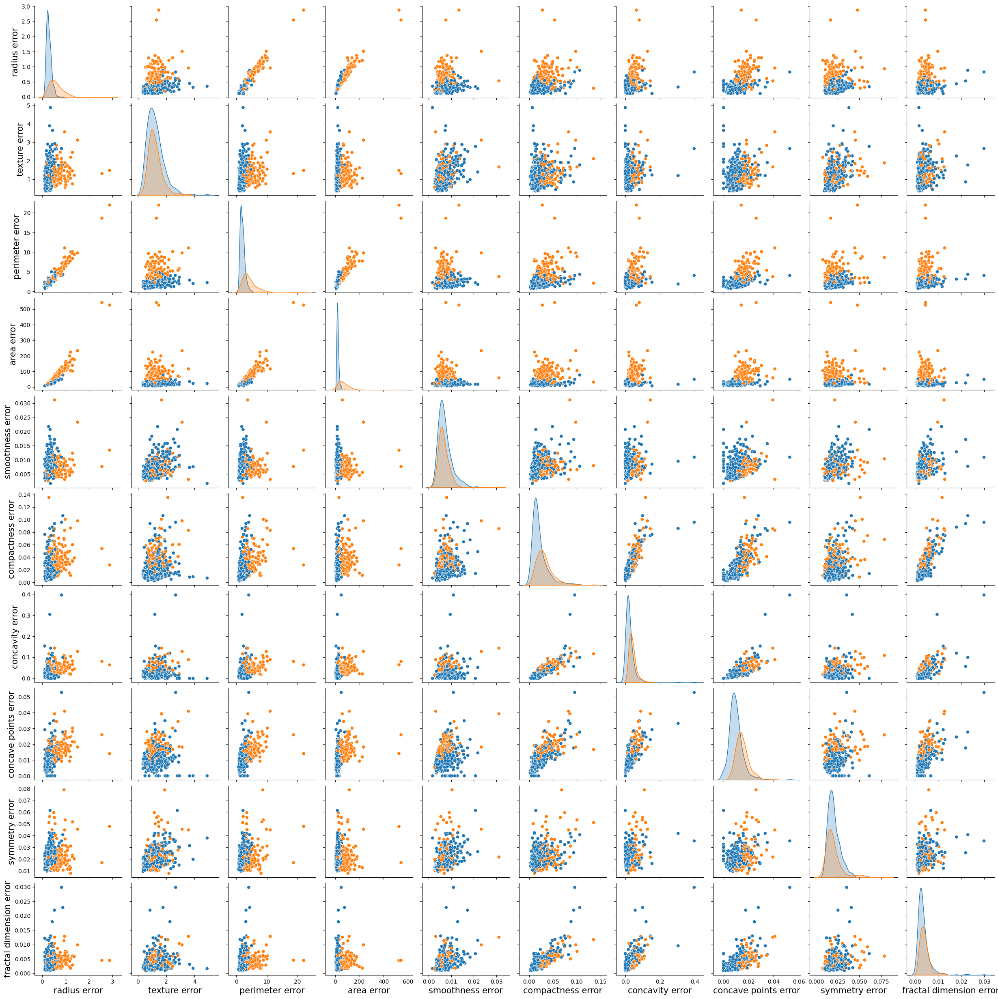

In [39]:
# Error
df = data[['radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error']].copy()
df['target'] = target


pairplot = sns.pairplot(df, hue='target', diag_kind="kde", palette=colors) # , markers=["o", "s"]
pairplot._legend.remove()

for ax in pairplot.axes.flatten():
       ax.set_xlabel(ax.get_xlabel(), fontsize=15)
       ax.set_ylabel(ax.get_ylabel(), fontsize=15)
       
plt.show()

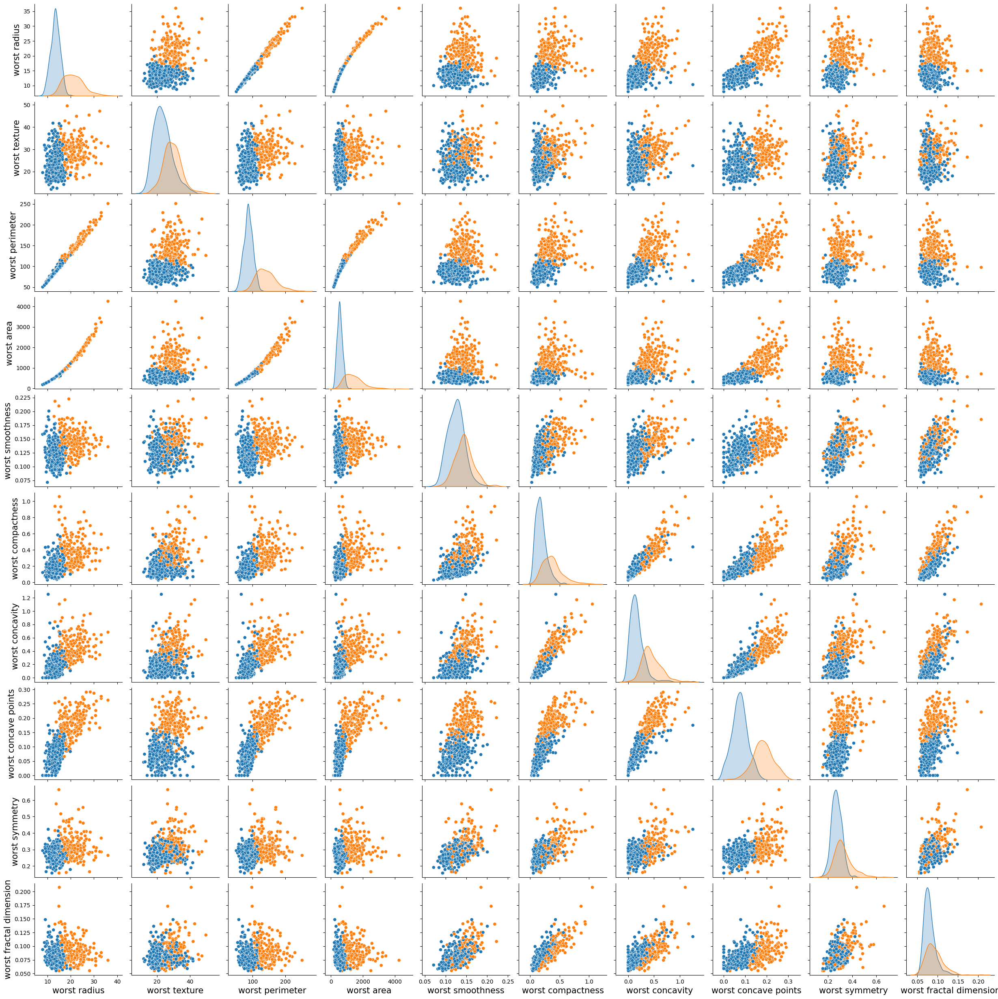

In [40]:
# Error
df = data[['worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension']].copy()
df['target'] = target


pairplot = sns.pairplot(df, hue='target', diag_kind="kde", palette=colors) # , markers=["o", "s"]
pairplot._legend.remove()

for ax in pairplot.axes.flatten():
       ax.set_xlabel(ax.get_xlabel(), fontsize=15)
       ax.set_ylabel(ax.get_ylabel(), fontsize=15)
       
plt.show()

#### Densidades conjuntas

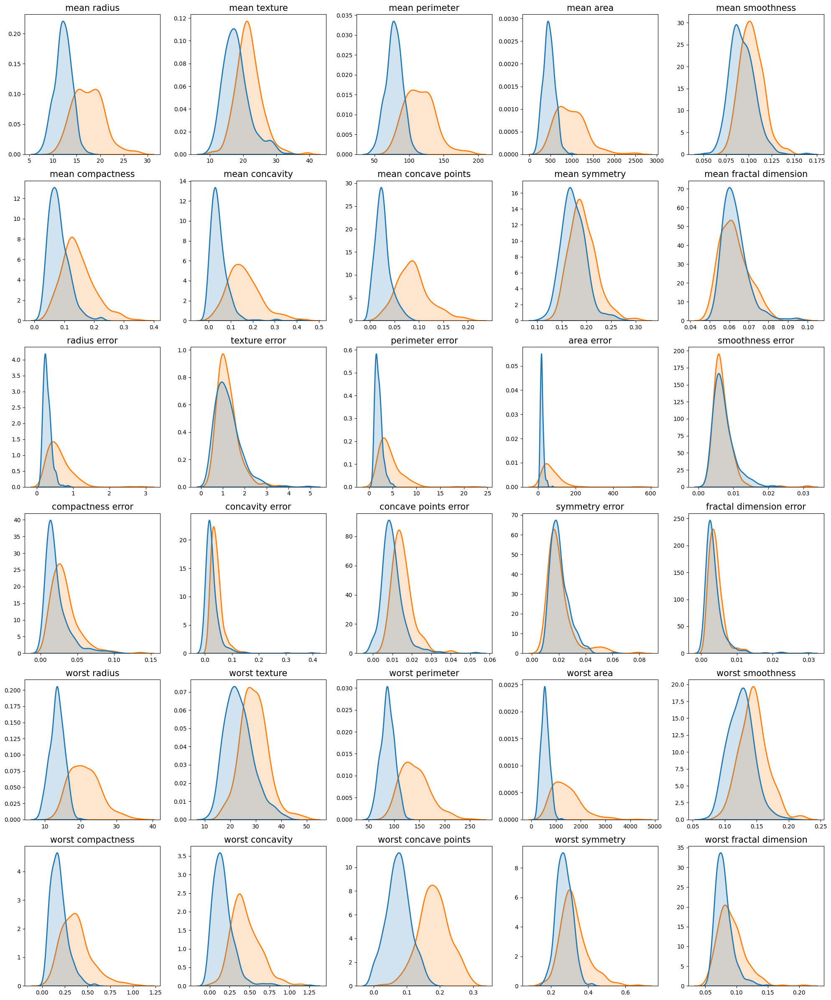

In [42]:
fig, axes = plt.subplots(6, 5, figsize=(20, 24))
axes = axes.flatten()

for i, col in enumerate(data.columns):
    ax = axes[i]
    for cls in target.unique():
        sns.kdeplot(
            data[target == cls][col],
            ax=ax,
            fill=True,
            alpha=0.2,
            linewidth=2,
            color=colors[cls]
        )
    ax.set_title(col, fontsize=15)
    ax.set_xlabel('')
    ax.set_ylabel('')
    if ax.get_legend():
        ax.get_legend().remove()

plt.tight_layout()
plt.show()

# Preprocesamiento y tratamiento de datos

## Preprocesado

In [ ]:
le = LabelEncoder()

target_encoded = le.fit_transform(target)

In [46]:
data_train, data_test, target_train, target_test = train_test_split(data, target_encoded, test_size=0.2, random_state=seed, stratify=target_encoded)

data_train.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
381,11.04,14.93,70.67,372.7,0.07987,0.07079,0.03546,0.020740,0.2003,0.06246,...,12.090,20.83,79.73,447.1,0.1095,0.1982,0.15530,0.06754,0.3202,0.07287
144,10.75,14.97,68.26,355.3,0.07793,0.05139,0.02251,0.007875,0.1399,0.05688,...,11.950,20.72,77.79,441.2,0.1076,0.1223,0.09755,0.03413,0.2300,0.06769
136,11.71,16.67,74.72,423.6,0.10510,0.06095,0.03592,0.026000,0.1339,0.05945,...,13.330,25.48,86.16,546.7,0.1271,0.1028,0.10460,0.06968,0.1712,0.07343
116,8.95,15.76,58.74,245.2,0.09462,0.12430,0.09263,0.023080,0.1305,0.07163,...,9.414,17.07,63.34,270.0,0.1179,0.1879,0.15440,0.03846,0.1652,0.07722
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.152000,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.1650,0.8681,0.93870,0.26500,0.4087,0.12400


In [47]:
scaler = StandardScaler()

data_train = pd.DataFrame(scaler.fit_transform(data_train), columns=data.columns)
data_test = pd.DataFrame(scaler.transform(data_test), columns=data.columns)

data_train.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,-0.862083,-1.009094,-0.861347,-0.786765,-1.158494,-0.615198,-0.654171,-0.707010,0.692286,-0.047962,...,-0.857701,-0.802311,-0.809130,-0.753108,-0.996486,-0.346704,-0.553743,-0.697964,0.481210,-0.604967
1,-0.944093,-0.999941,-0.959931,-0.835771,-1.296173,-0.978211,-0.811038,-1.031182,-1.503224,-0.836375,...,-0.886863,-0.820201,-0.866969,-0.763508,-1.079789,-0.830368,-0.824462,-1.197365,-0.972434,-0.886765
2,-0.672612,-0.610936,-0.695675,-0.643408,0.632048,-0.799324,-0.648599,-0.574468,-1.721321,-0.473253,...,-0.599404,-0.046036,-0.617429,-0.577535,-0.224836,-0.954630,-0.791414,-0.665977,-1.920043,-0.574502
3,-1.453119,-0.819168,-1.349362,-1.145863,-0.111705,0.386082,0.038345,-0.648046,-1.844910,1.247692,...,-1.415120,-1.413837,-1.297775,-1.065297,-0.628198,-0.412339,-0.557962,-1.132642,-2.016737,-0.368322
4,1.841410,2.286005,1.978793,1.726355,1.533350,3.243407,3.172896,2.600480,2.124457,1.039991,...,1.985640,2.221163,2.317423,1.668781,1.436843,3.922159,3.118660,2.253595,1.907458,2.176563


In [ ]:
smote = SMOTE(random_state=seed)

data_resampled, target_resampled = smote.fit_resample(data_train, target_train)

data_resampled.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,-0.862083,-1.009094,-0.861347,-0.786765,-1.158494,-0.615198,-0.654171,-0.707010,0.692286,-0.047962,...,-0.857701,-0.802311,-0.809130,-0.753108,-0.996486,-0.346704,-0.553743,-0.697964,0.481210,-0.604967
1,-0.944093,-0.999941,-0.959931,-0.835771,-1.296173,-0.978211,-0.811038,-1.031182,-1.503224,-0.836375,...,-0.886863,-0.820201,-0.866969,-0.763508,-1.079789,-0.830368,-0.824462,-1.197365,-0.972434,-0.886765
2,-0.672612,-0.610936,-0.695675,-0.643408,0.632048,-0.799324,-0.648599,-0.574468,-1.721321,-0.473253,...,-0.599404,-0.046036,-0.617429,-0.577535,-0.224836,-0.954630,-0.791414,-0.665977,-1.920043,-0.574502
3,-1.453119,-0.819168,-1.349362,-1.145863,-0.111705,0.386082,0.038345,-0.648046,-1.844910,1.247692,...,-1.415120,-1.413837,-1.297775,-1.065297,-0.628198,-0.412339,-0.557962,-1.132642,-2.016737,-0.368322
4,1.841410,2.286005,1.978793,1.726355,1.533350,3.243407,3.172896,2.600480,2.124457,1.039991,...,1.985640,2.221163,2.317423,1.668781,1.436843,3.922159,3.118660,2.253595,1.907458,2.176563


In [52]:
Counter(target_train)

Counter({np.int64(0): 285, np.int64(1): 170})

In [50]:
Counter(target_resampled)

Counter({np.int64(0): 285, np.int64(1): 285})

## Feature selection

In [ ]:

# --- Fase de Tratamiento de Datos: Selección y Importancia de Características ---

# Esta sub-fase se centra en identificar las características más relevantes.
# Utilizaremos la importancia de características inherente a Random Forest.

# Inicializar un modelo Random Forest (inicialmente con parámetros por defecto para calcular importancia)
# n_estimators: Número de árboles en el bosque. 100 es un valor común.
# random_state: Para reproducibilidad.
# oob_score=True: Habilita el cálculo del "out-of-bag score", útil para evaluar el modelo
#                  y se usa en la importancia de permutación si no se especifica un conjunto de datos.
rf_model_importance = RandomForestClassifier(n_estimators=100, random_state=42, oob_score=True)

# Entrenar el modelo en el conjunto de entrenamiento escalado
# Aunque el escalado no es estrictamente necesario para RF, usamos los datos escalados
# ya que serán los que probablemente usemos para entrenar el modelo final.
rf_model_importance.fit(data_train, target_train)

# 1. Importancia de Características basada en la Disminución de la Impureza (Gini Importance)
# Accedemos al atributo feature_importances_ del modelo entrenado.
gini_importance = rf_model_importance.feature_importances_

# Creamos un DataFrame para visualizar y ordenar la importancia de Gini
gini_importance_df = pd.DataFrame({'feature': data.columns, 'gini_importance': gini_importance})
gini_importance_df = gini_importance_df.sort_values(by='gini_importance', ascending=False)

print("\nImportancia de Características basada en la Disminución de la Impureza (Gini Importance):")
print(gini_importance_df)

# Visualizar la importancia de Gini
plt.figure(figsize=(12, 8))
sns.barplot(x='gini_importance', y='feature', data=gini_importance_df)
plt.title("Importancia de Características (Gini Importance)", fontsize=18)
plt.xlabel("Importancia de Gini Media (Disminución de Impureza)", fontsize=14)
plt.ylabel("Característica", fontsize=14)
plt.tight_layout()
plt.show()

# 2. Importancia de Características basada en la Permutación (Permutation Importance)
# Esta medida es generalmente más fiable, especialmente con características correlacionadas.
# La calculamos en el conjunto de prueba (o un conjunto de validación independiente)
# para evaluar cuánto disminuye el rendimiento del modelo al permutar una característica.

# Calcular la importancia de permutación en el conjunto de prueba escalado.
# n_repeats: Número de veces que se permuta cada característica. Un número mayor da un resultado más estable.
# n_jobs=-1: Usa todos los núcleos disponibles para acelerar el cálculo.
perm_importance = permutation_importance(rf_model_importance, data_test, target_test, n_repeats=10, random_state=42, n_jobs=-1)

# Creamos un DataFrame para visualizar y ordenar la importancia de permutación
# Utilizamos la media de las importancias obtenidas en las repeticiones.
perm_importance_df = pd.DataFrame({'feature': data.columns, 'perm_importance_mean': perm_importance.importances_mean})
perm_importance_df = perm_importance_df.sort_values(by='perm_importance_mean', ascending=False)

print("\nImportancia de Características basada en la Permutación:")
print(perm_importance_df)

# Visualizar la importancia de permutación
plt.figure(figsize=(12, 8))
sns.barplot(x='perm_importance_mean', y='feature', data=perm_importance_df)
plt.title("Importancia de Características (Permutation Importance)", fontsize=18)
plt.xlabel("Importancia de Permutación Media (Disminución en la Precisión)", fontsize=14)
plt.ylabel("Característica", fontsize=14)
plt.tight_layout()
plt.show()

# 3. Selección de Características Basada en la Importancia de Random Forest
# Basándonos en el análisis de la importancia de características (especialmente la de permutación),
# seleccionamos un subconjunto de características para el modelado.
# Aquí seleccionaremos las top N características como ejemplo práctico.

# Definir el número de características a seleccionar (ejemplo: top 10)
top_n = 10

# Obtener la lista de nombres de las top N características por importancia de permutación
selected_features_top_n = perm_importance_df['feature'].head(top_n).tolist()

print(f"\nTop {top_n} Características seleccionadas por importancia de permutación:")
print(selected_features_top_n)

# Crear nuevos DataFrames de entrenamiento y prueba que contengan solo las características seleccionadas
data_train_selected = data_train[selected_features_top_n]
data_test_selected = data_test[selected_features_top_n]

print(f"\nPrimeras 5 filas del dataset de entrenamiento con las {top_n} características seleccionadas:")
print(data_train_selected.head())

print(f"\nDimensiones del dataset de entrenamiento con características seleccionadas: {data_train_selected.shape}")
print(f"Dimensiones del dataset de prueba con características seleccionadas: {data_test_selected.shape}")

# Discusión Crítica para la Memoria:
# En la memoria, deben discutir por qué eligieron aplicar Standard Scaling (a pesar de que RF es robusto a la escala),
# justificar por qué no se aplicaron técnicas para valores faltantes, outliers o desbalance de clases
# (basándose en el análisis de la Fase 1 y la robustez de RF).
# Crucialmente, deben comparar y contrastar las medidas de importancia de Gini y Permutación obtenidas,
# discutiendo sus diferencias y por qué la importancia de permutación puede ser más fiable.
# Finalmente, justifiquen el método y el número de características seleccionadas,
# relacionándolo con la teoría de Random Forest y cómo esta selección de características embebida se compara
# con los métodos de filtro y wrapper vistos en temas anteriores.